In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
DATA_DIR = '/content/drive/My Drive/Data_DétectionFaussesMonnaies'

In [ ]:
project_name = 'dcgan'

Loading the Data

In [ ]:
import os

print(os.listdir(DATA_DIR))

['5dt', '10dt', '20dt', '50dt']


In [ ]:
print(os.listdir(DATA_DIR+'/5dt')[:10])

['5dt_original_1.jpg_26f703f8-caa1-4756-bd01-c05ffcda7642.jpg', '5dt_original_1.jpg_81cf57e0-23ca-4a7a-acf0-74c66e8154e5.jpg', '5dt_original_1.jpg_9d7c66e1-5b14-48a7-87f3-db3ab8800728.jpg', '5dt_original_2.jpg_4dcafa2d-4a88-435a-8a1e-aee0690e0797.jpg', '5dt_original_2.jpg_9c5c2250-4861-4844-9b3b-3102c1c831b8.jpg', '5dt_original_2.jpg_5272e309-ad07-461b-b969-4ff9c477896c.jpg', '5dt_original_1.jpg_c64fb81b-adb3-49d0-8df0-a4cb7f1894b6.jpg', '5dt_original_1.jpg_292751df-d9d3-4c87-8d92-a81d6ff57415.jpg', '5dt_original_1.jpg_073788a6-8575-40e4-b266-7b79bafd11a5.jpg', '5dt_original_2.jpg_7e45e2b1-1a04-4653-b539-4d498a2bfde9.jpg']


In [ ]:
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T

In [ ]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [ ]:
train_ds = ImageFolder(DATA_DIR, transform=T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor(),
    T.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

In [ ]:
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [ ]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

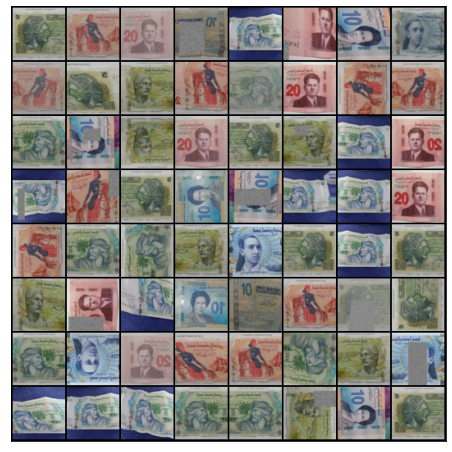

In [ ]:
show_batch(train_dl)

In [ ]:
!pip install jovian --upgrade --quiet

     |████████████████████████████████| 71kB 2.0MB/s 


In [ ]:
import jovian

Using a GPU

In [ ]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [ ]:
device = get_default_device()
device

device(type='cpu')

In [ ]:
train_dl = DeviceDataLoader(train_dl, device)

Discriminator Network

In [ ]:
import torch.nn as nn

In [ ]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [ ]:
discriminator = to_device(discriminator, device) #ERROR

GENERATOR NETWORK

In [ ]:
latent_size = 128

In [ ]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

torch.Size([128, 3, 64, 64])


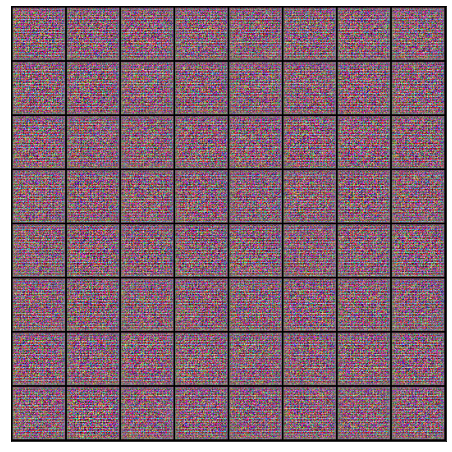

In [ ]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [ ]:
generator = to_device(generator, device)

Discriminator Training

In [ ]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

Generator Training

In [ ]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)
    
    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)
    
    # Update generator weights
    loss.backward()
    opt_g.step()
    
    return loss.item()

In [ ]:
from torchvision.utils import save_image

In [ ]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [ ]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [ ]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-0000.png


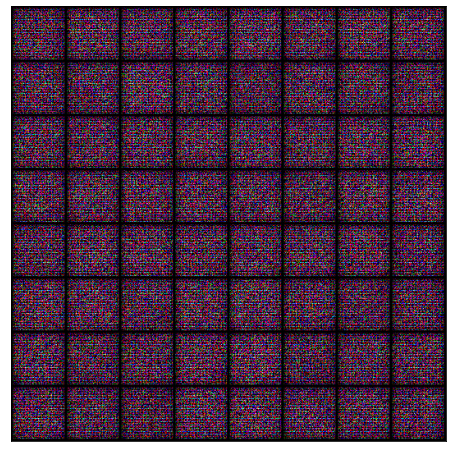

In [ ]:
save_samples(0, fixed_latent)

Full Training Loop

In [ ]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [ ]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()
    
    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    
    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)
            
        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)
        
        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))
    
        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)
    
    return losses_g, losses_d, real_scores, fake_scores

In [ ]:
lr = 0.0002
epochs = 250

In [ ]:
jovian.reset()
jovian.log_hyperparams(lr=lr, epochs=epochs)

[jovian] Please enter your API key ( from https://jovian.ml/ ):
API KEY: ··········
[jovian] Hyperparams logged.


In [ ]:
history = fit(epochs, lr)


Epoch [1/250], loss_g: 2.1761, loss_d: 1.4124, real_score: 0.4668, fake_score: 0.4596
Saving generated-images-0001.png



Epoch [2/250], loss_g: 3.1722, loss_d: 1.1808, real_score: 0.9031, fake_score: 0.6479
Saving generated-images-0002.png



Epoch [3/250], loss_g: 4.2824, loss_d: 0.6670, real_score: 0.8420, fake_score: 0.3710
Saving generated-images-0003.png



Epoch [4/250], loss_g: 4.1410, loss_d: 0.4990, real_score: 0.7659, fake_score: 0.1697
Saving generated-images-0004.png



Epoch [5/250], loss_g: 5.1075, loss_d: 0.4797, real_score: 0.8420, fake_score: 0.2480
Saving generated-images-0005.png



Epoch [6/250], loss_g: 5.3238, loss_d: 0.3114, real_score: 0.8591, fake_score: 0.1358
Saving generated-images-0006.png



Epoch [7/250], loss_g: 5.9211, loss_d: 0.3425, real_score: 0.8961, fake_score: 0.2008
Saving generated-images-0007.png



Epoch [8/250], loss_g: 5.8822, loss_d: 0.2371, real_score: 0.8833, fake_score: 0.1012
Saving generated-images-0008.png



Epoch [9/250], loss_g: 6.6880, loss_d: 0.2348, real_score: 0.9160, fake_score: 0.1323
Saving generated-images-0009.png



Epoch [10/250], loss_g: 6.4331, loss_d: 0.1496, real_score: 0.9238, fake_score: 0.0653
Saving generated-images-0010.png



Epoch [11/250], loss_g: 7.8994, loss_d: 0.2092, real_score: 0.9442, fake_score: 0.1374
Saving generated-images-0011.png



Epoch [12/250], loss_g: 7.0517, loss_d: 0.1073, real_score: 0.9308, fake_score: 0.0326
Saving generated-images-0012.png



Epoch [13/250], loss_g: 9.7001, loss_d: 0.2456, real_score: 0.9517, fake_score: 0.1742
Saving generated-images-0013.png



Epoch [14/250], loss_g: 8.3186, loss_d: 0.1010, real_score: 0.9112, fake_score: 0.0051
Saving generated-images-0014.png



Epoch [15/250], loss_g: 7.7961, loss_d: 0.1346, real_score: 0.9541, fake_score: 0.0823
Saving generated-images-0015.png



Epoch [16/250], loss_g: 10.4311, loss_d: 0.1731, real_score: 0.9582, fake_score: 0.1202
Saving generated-images-0016.png



Epoch [17/250], loss_g: 8.4678, loss_d: 0.0932, real_score: 0.9170, fake_score: 0.0045
Saving generated-images-0017.png



Epoch [18/250], loss_g: 9.5580, loss_d: 0.1449, real_score: 0.9629, fake_score: 0.1002
Saving generated-images-0018.png



Epoch [19/250], loss_g: 8.2510, loss_d: 0.0600, real_score: 0.9541, fake_score: 0.0121
Saving generated-images-0019.png



Epoch [20/250], loss_g: 9.9979, loss_d: 0.1250, real_score: 0.9682, fake_score: 0.0873
Saving generated-images-0020.png



Epoch [21/250], loss_g: 8.5746, loss_d: 0.0507, real_score: 0.9558, fake_score: 0.0047
Saving generated-images-0021.png



Epoch [22/250], loss_g: 9.4085, loss_d: 0.1023, real_score: 0.9727, fake_score: 0.0709
Saving generated-images-0022.png



Epoch [23/250], loss_g: 8.1614, loss_d: 0.0432, real_score: 0.9689, fake_score: 0.0112
Saving generated-images-0023.png



Epoch [24/250], loss_g: 10.3979, loss_d: 0.1058, real_score: 0.9761, fake_score: 0.0775
Saving generated-images-0024.png



Epoch [25/250], loss_g: 9.0275, loss_d: 0.0389, real_score: 0.9652, fake_score: 0.0031
Saving generated-images-0025.png



Epoch [26/250], loss_g: 7.6980, loss_d: 0.0566, real_score: 0.9750, fake_score: 0.0304
Saving generated-images-0026.png



Epoch [27/250], loss_g: 12.2044, loss_d: 0.1266, real_score: 0.9791, fake_score: 0.0989
Saving generated-images-0027.png



Epoch [28/250], loss_g: 12.1941, loss_d: 0.0471, real_score: 0.9547, fake_score: 0.0001
Saving generated-images-0028.png



Epoch [29/250], loss_g: 9.8039, loss_d: 0.0301, real_score: 0.9708, fake_score: 0.0002
Saving generated-images-0029.png



Epoch [30/250], loss_g: 6.1359, loss_d: 0.0254, real_score: 0.9839, fake_score: 0.0091
Saving generated-images-0030.png



Epoch [31/250], loss_g: 17.1009, loss_d: 0.6976, real_score: 0.9895, fake_score: 0.4824
Saving generated-images-0031.png



Epoch [32/250], loss_g: 18.1530, loss_d: 0.2615, real_score: 0.7877, fake_score: 0.0000
Saving generated-images-0032.png



Epoch [33/250], loss_g: 17.5077, loss_d: 0.0769, real_score: 0.9331, fake_score: 0.0000
Saving generated-images-0033.png



Epoch [34/250], loss_g: 16.1869, loss_d: 0.0210, real_score: 0.9801, fake_score: 0.0000
Saving generated-images-0034.png



Epoch [35/250], loss_g: 14.2251, loss_d: 0.0115, real_score: 0.9889, fake_score: 0.0000
Saving generated-images-0035.png



Epoch [36/250], loss_g: 11.1438, loss_d: 0.0073, real_score: 0.9928, fake_score: 0.0000
Saving generated-images-0036.png



Epoch [37/250], loss_g: 6.7776, loss_d: 0.0067, real_score: 0.9948, fake_score: 0.0014
Saving generated-images-0037.png



Epoch [38/250], loss_g: 16.3504, loss_d: 0.6767, real_score: 0.9959, fake_score: 0.4790
Saving generated-images-0038.png



Epoch [39/250], loss_g: 17.7463, loss_d: 0.0339, real_score: 0.9681, fake_score: 0.0000
Saving generated-images-0039.png



Epoch [40/250], loss_g: 17.5534, loss_d: 0.0887, real_score: 0.9215, fake_score: 0.0000
Saving generated-images-0040.png



Epoch [41/250], loss_g: 16.9609, loss_d: 0.0416, real_score: 0.9606, fake_score: 0.0000
Saving generated-images-0041.png



Epoch [42/250], loss_g: 15.9860, loss_d: 0.0202, real_score: 0.9803, fake_score: 0.0000
Saving generated-images-0042.png



Epoch [43/250], loss_g: 14.4558, loss_d: 0.0129, real_score: 0.9874, fake_score: 0.0000
Saving generated-images-0043.png



Epoch [44/250], loss_g: 12.0828, loss_d: 0.0091, real_score: 0.9910, fake_score: 0.0000
Saving generated-images-0044.png



Epoch [45/250], loss_g: 7.6908, loss_d: 0.0075, real_score: 0.9932, fake_score: 0.0006
Saving generated-images-0045.png



Epoch [46/250], loss_g: 17.2509, loss_d: 1.1014, real_score: 0.9944, fake_score: 0.6350
Saving generated-images-0046.png



Epoch [47/250], loss_g: 18.3336, loss_d: 0.1811, real_score: 0.8486, fake_score: 0.0000
Saving generated-images-0047.png



Epoch [48/250], loss_g: 17.9686, loss_d: 0.1390, real_score: 0.8789, fake_score: 0.0000
Saving generated-images-0048.png



Epoch [49/250], loss_g: 17.2817, loss_d: 0.0364, real_score: 0.9649, fake_score: 0.0000
Saving generated-images-0049.png



Epoch [50/250], loss_g: 16.3467, loss_d: 0.0169, real_score: 0.9834, fake_score: 0.0000
Saving generated-images-0050.png



Epoch [51/250], loss_g: 15.1177, loss_d: 0.0107, real_score: 0.9895, fake_score: 0.0000
Saving generated-images-0051.png



Epoch [52/250], loss_g: 13.0933, loss_d: 0.0079, real_score: 0.9922, fake_score: 0.0000
Saving generated-images-0052.png



Epoch [53/250], loss_g: 9.6420, loss_d: 0.0066, real_score: 0.9936, fake_score: 0.0001
Saving generated-images-0053.png



Epoch [54/250], loss_g: 6.1461, loss_d: 0.0386, real_score: 0.9945, fake_score: 0.0320
Saving generated-images-0054.png



Epoch [55/250], loss_g: 17.4935, loss_d: 2.4237, real_score: 0.9942, fake_score: 0.8862
Saving generated-images-0055.png



Epoch [56/250], loss_g: 18.2547, loss_d: 0.6795, real_score: 0.6041, fake_score: 0.0000
Saving generated-images-0056.png



Epoch [57/250], loss_g: 17.9207, loss_d: 0.1678, real_score: 0.8774, fake_score: 0.0000
Saving generated-images-0057.png



Epoch [58/250], loss_g: 17.0739, loss_d: 0.0441, real_score: 0.9603, fake_score: 0.0000
Saving generated-images-0058.png



Epoch [59/250], loss_g: 16.0777, loss_d: 0.0242, real_score: 0.9772, fake_score: 0.0000
Saving generated-images-0059.png



Epoch [60/250], loss_g: 14.9154, loss_d: 0.0167, real_score: 0.9840, fake_score: 0.0000
Saving generated-images-0060.png



Epoch [61/250], loss_g: 13.3163, loss_d: 0.0126, real_score: 0.9878, fake_score: 0.0000
Saving generated-images-0061.png



Epoch [62/250], loss_g: 10.8115, loss_d: 0.0102, real_score: 0.9902, fake_score: 0.0001
Saving generated-images-0062.png



Epoch [63/250], loss_g: 7.0501, loss_d: 0.0144, real_score: 0.9918, fake_score: 0.0059
Saving generated-images-0063.png



Epoch [64/250], loss_g: 15.5648, loss_d: 1.8644, real_score: 0.9927, fake_score: 0.7336
Saving generated-images-0064.png



Epoch [65/250], loss_g: 16.1150, loss_d: 0.0727, real_score: 0.9362, fake_score: 0.0000
Saving generated-images-0065.png



Epoch [66/250], loss_g: 14.9137, loss_d: 0.2124, real_score: 0.8401, fake_score: 0.0000
Saving generated-images-0066.png



Epoch [67/250], loss_g: 13.2337, loss_d: 0.1282, real_score: 0.8926, fake_score: 0.0000
Saving generated-images-0067.png



Epoch [68/250], loss_g: 11.1135, loss_d: 0.0490, real_score: 0.9543, fake_score: 0.0003
Saving generated-images-0068.png



Epoch [69/250], loss_g: 8.3437, loss_d: 0.0315, real_score: 0.9763, fake_score: 0.0071
Saving generated-images-0069.png



Epoch [70/250], loss_g: 6.4674, loss_d: 0.1157, real_score: 0.9842, fake_score: 0.0916
Saving generated-images-0070.png



Epoch [71/250], loss_g: 11.9551, loss_d: 0.7098, real_score: 0.9849, fake_score: 0.4395
Saving generated-images-0071.png



Epoch [72/250], loss_g: 12.4934, loss_d: 0.0661, real_score: 0.9396, fake_score: 0.0002
Saving generated-images-0072.png



Epoch [73/250], loss_g: 11.0047, loss_d: 0.1037, real_score: 0.9095, fake_score: 0.0001
Saving generated-images-0073.png



Epoch [74/250], loss_g: 9.0651, loss_d: 0.0727, real_score: 0.9343, fake_score: 0.0002
Saving generated-images-0074.png



Epoch [75/250], loss_g: 6.2497, loss_d: 0.0450, real_score: 0.9604, fake_score: 0.0032
Saving generated-images-0075.png



Epoch [76/250], loss_g: 5.5403, loss_d: 0.1488, real_score: 0.9748, fake_score: 0.1125
Saving generated-images-0076.png



Epoch [77/250], loss_g: 9.9657, loss_d: 0.3405, real_score: 0.9745, fake_score: 0.2573
Saving generated-images-0077.png



Epoch [78/250], loss_g: 10.5067, loss_d: 0.0944, real_score: 0.9191, fake_score: 0.0014
Saving generated-images-0078.png



Epoch [79/250], loss_g: 8.9092, loss_d: 0.0753, real_score: 0.9316, fake_score: 0.0013
Saving generated-images-0079.png



Epoch [80/250], loss_g: 6.2017, loss_d: 0.0570, real_score: 0.9556, fake_score: 0.0103
Saving generated-images-0080.png



Epoch [81/250], loss_g: 8.9460, loss_d: 0.3762, real_score: 0.9706, fake_score: 0.2734
Saving generated-images-0081.png



Epoch [82/250], loss_g: 8.3338, loss_d: 0.0818, real_score: 0.9322, fake_score: 0.0077
Saving generated-images-0082.png



Epoch [83/250], loss_g: 6.1366, loss_d: 0.0895, real_score: 0.9336, fake_score: 0.0170
Saving generated-images-0083.png



Epoch [84/250], loss_g: 8.7700, loss_d: 0.3071, real_score: 0.9556, fake_score: 0.2159
Saving generated-images-0084.png



Epoch [85/250], loss_g: 7.8787, loss_d: 0.1076, real_score: 0.9094, fake_score: 0.0087
Saving generated-images-0085.png



Epoch [86/250], loss_g: 5.7999, loss_d: 0.1024, real_score: 0.9304, fake_score: 0.0280
Saving generated-images-0086.png



Epoch [87/250], loss_g: 12.5666, loss_d: 0.5719, real_score: 0.9567, fake_score: 0.3901
Saving generated-images-0087.png



Epoch [88/250], loss_g: 11.0540, loss_d: 0.5541, real_score: 0.6107, fake_score: 0.0001
Saving generated-images-0088.png



Epoch [89/250], loss_g: 8.4763, loss_d: 0.0749, real_score: 0.9356, fake_score: 0.0006
Saving generated-images-0089.png



Epoch [90/250], loss_g: 4.8111, loss_d: 0.0383, real_score: 0.9792, fake_score: 0.0164
Saving generated-images-0090.png



Epoch [91/250], loss_g: 9.9325, loss_d: 0.5621, real_score: 0.9859, fake_score: 0.3879
Saving generated-images-0091.png



Epoch [92/250], loss_g: 10.4148, loss_d: 0.0496, real_score: 0.9545, fake_score: 0.0008
Saving generated-images-0092.png



Epoch [93/250], loss_g: 9.2397, loss_d: 0.0886, real_score: 0.9200, fake_score: 0.0005
Saving generated-images-0093.png



Epoch [94/250], loss_g: 7.6071, loss_d: 0.0701, real_score: 0.9360, fake_score: 0.0017
Saving generated-images-0094.png



Epoch [95/250], loss_g: 5.4949, loss_d: 0.0514, real_score: 0.9623, fake_score: 0.0123
Saving generated-images-0095.png



Epoch [96/250], loss_g: 4.8376, loss_d: 0.1332, real_score: 0.9758, fake_score: 0.1013
Saving generated-images-0096.png



Epoch [97/250], loss_g: 5.7722, loss_d: 0.1597, real_score: 0.9742, fake_score: 0.1227
Saving generated-images-0097.png



Epoch [98/250], loss_g: 5.5350, loss_d: 0.0751, real_score: 0.9583, fake_score: 0.0310
Saving generated-images-0098.png



Epoch [99/250], loss_g: 5.4747, loss_d: 0.0929, real_score: 0.9545, fake_score: 0.0440
Saving generated-images-0099.png



Epoch [100/250], loss_g: 5.4201, loss_d: 0.1307, real_score: 0.9591, fake_score: 0.0835
Saving generated-images-0100.png



Epoch [101/250], loss_g: 5.6698, loss_d: 0.1214, real_score: 0.9532, fake_score: 0.0695
Saving generated-images-0101.png



Epoch [102/250], loss_g: 6.4084, loss_d: 0.1332, real_score: 0.9448, fake_score: 0.0720
Saving generated-images-0102.png



Epoch [103/250], loss_g: 5.8397, loss_d: 0.0954, real_score: 0.9348, fake_score: 0.0264
Saving generated-images-0103.png



Epoch [104/250], loss_g: 7.3415, loss_d: 0.1524, real_score: 0.9545, fake_score: 0.0983
Saving generated-images-0104.png



Epoch [105/250], loss_g: 5.6796, loss_d: 0.0855, real_score: 0.9343, fake_score: 0.0162
Saving generated-images-0105.png



Epoch [106/250], loss_g: 6.0428, loss_d: 0.1222, real_score: 0.9541, fake_score: 0.0711
Saving generated-images-0106.png



Epoch [107/250], loss_g: 6.2346, loss_d: 0.1022, real_score: 0.9526, fake_score: 0.0514
Saving generated-images-0107.png



Epoch [108/250], loss_g: 5.8394, loss_d: 0.0887, real_score: 0.9500, fake_score: 0.0360
Saving generated-images-0108.png



Epoch [109/250], loss_g: 6.4333, loss_d: 0.1177, real_score: 0.9560, fake_score: 0.0692
Saving generated-images-0109.png



Epoch [110/250], loss_g: 6.1557, loss_d: 0.0993, real_score: 0.9411, fake_score: 0.0370
Saving generated-images-0110.png



Epoch [111/250], loss_g: 6.2564, loss_d: 0.1023, real_score: 0.9507, fake_score: 0.0497
Saving generated-images-0111.png



Epoch [112/250], loss_g: 6.1202, loss_d: 0.0845, real_score: 0.9533, fake_score: 0.0355
Saving generated-images-0112.png



Epoch [113/250], loss_g: 6.3172, loss_d: 0.0826, real_score: 0.9600, fake_score: 0.0405
Saving generated-images-0113.png



Epoch [114/250], loss_g: 8.0560, loss_d: 0.1378, real_score: 0.9597, fake_score: 0.0906
Saving generated-images-0114.png



Epoch [115/250], loss_g: 5.8023, loss_d: 0.1270, real_score: 0.8911, fake_score: 0.0091
Saving generated-images-0115.png



Epoch [116/250], loss_g: 8.0306, loss_d: 0.1334, real_score: 0.9721, fake_score: 0.0985
Saving generated-images-0116.png



Epoch [117/250], loss_g: 7.0665, loss_d: 0.0542, real_score: 0.9554, fake_score: 0.0081
Saving generated-images-0117.png



Epoch [118/250], loss_g: 5.5759, loss_d: 0.0623, real_score: 0.9610, fake_score: 0.0219
Saving generated-images-0118.png



Epoch [119/250], loss_g: 7.9638, loss_d: 0.1476, real_score: 0.9704, fake_score: 0.1081
Saving generated-images-0119.png



Epoch [120/250], loss_g: 5.2979, loss_d: 0.1549, real_score: 0.8640, fake_score: 0.0051
Saving generated-images-0120.png



Epoch [121/250], loss_g: 9.2894, loss_d: 0.2304, real_score: 0.9703, fake_score: 0.1738
Saving generated-images-0121.png



Epoch [122/250], loss_g: 7.9993, loss_d: 0.1352, real_score: 0.8780, fake_score: 0.0011
Saving generated-images-0122.png



Epoch [123/250], loss_g: 6.0523, loss_d: 0.0363, real_score: 0.9706, fake_score: 0.0062
Saving generated-images-0123.png



Epoch [124/250], loss_g: 5.5742, loss_d: 0.0762, real_score: 0.9875, fake_score: 0.0596
Saving generated-images-0124.png



Epoch [125/250], loss_g: 7.4708, loss_d: 0.1091, real_score: 0.9854, fake_score: 0.0887
Saving generated-images-0125.png



Epoch [126/250], loss_g: 6.1071, loss_d: 0.0817, real_score: 0.9304, fake_score: 0.0085
Saving generated-images-0126.png



Epoch [127/250], loss_g: 5.6434, loss_d: 0.0914, real_score: 0.9597, fake_score: 0.0484
Saving generated-images-0127.png



Epoch [128/250], loss_g: 9.3866, loss_d: 0.1780, real_score: 0.9525, fake_score: 0.1192
Saving generated-images-0128.png



Epoch [129/250], loss_g: 0.7388, loss_d: 1.0680, real_score: 0.4560, fake_score: 0.0023
Saving generated-images-0129.png



Epoch [130/250], loss_g: 7.0758, loss_d: 6.8301, real_score: 0.8694, fake_score: 0.9010
Saving generated-images-0130.png



Epoch [131/250], loss_g: 6.9049, loss_d: 0.5491, real_score: 0.6424, fake_score: 0.0067
Saving generated-images-0131.png



Epoch [132/250], loss_g: 4.3190, loss_d: 0.5103, real_score: 0.6393, fake_score: 0.0072
Saving generated-images-0132.png



Epoch [133/250], loss_g: 2.9212, loss_d: 0.2143, real_score: 0.9019, fake_score: 0.0981
Saving generated-images-0133.png



Epoch [134/250], loss_g: 5.1389, loss_d: 0.4637, real_score: 0.9490, fake_score: 0.3272
Saving generated-images-0134.png



Epoch [135/250], loss_g: 5.4761, loss_d: 0.1617, real_score: 0.8886, fake_score: 0.0384
Saving generated-images-0135.png



Epoch [136/250], loss_g: 4.2069, loss_d: 0.1775, real_score: 0.8704, fake_score: 0.0333
Saving generated-images-0136.png



Epoch [137/250], loss_g: 5.0706, loss_d: 0.3057, real_score: 0.9164, fake_score: 0.1928
Saving generated-images-0137.png



Epoch [138/250], loss_g: 5.0093, loss_d: 0.2225, real_score: 0.8619, fake_score: 0.0645
Saving generated-images-0138.png



Epoch [139/250], loss_g: 4.6190, loss_d: 0.2155, real_score: 0.8851, fake_score: 0.0843
Saving generated-images-0139.png



Epoch [140/250], loss_g: 5.5405, loss_d: 0.2297, real_score: 0.9100, fake_score: 0.1230
Saving generated-images-0140.png



Epoch [141/250], loss_g: 4.9801, loss_d: 0.1674, real_score: 0.8861, fake_score: 0.0404
Saving generated-images-0141.png



Epoch [142/250], loss_g: 4.6329, loss_d: 0.1577, real_score: 0.9225, fake_score: 0.0715
Saving generated-images-0142.png



Epoch [143/250], loss_g: 5.2119, loss_d: 0.1869, real_score: 0.9342, fake_score: 0.1092
Saving generated-images-0143.png



Epoch [144/250], loss_g: 4.7952, loss_d: 0.1536, real_score: 0.9089, fake_score: 0.0538
Saving generated-images-0144.png



Epoch [145/250], loss_g: 4.6811, loss_d: 0.1617, real_score: 0.9216, fake_score: 0.0749
Saving generated-images-0145.png



Epoch [146/250], loss_g: 5.2176, loss_d: 0.1806, real_score: 0.9305, fake_score: 0.1009
Saving generated-images-0146.png



Epoch [147/250], loss_g: 5.1198, loss_d: 0.1459, real_score: 0.9144, fake_score: 0.0532
Saving generated-images-0147.png



Epoch [148/250], loss_g: 5.4563, loss_d: 0.1559, real_score: 0.9287, fake_score: 0.0773
Saving generated-images-0148.png



Epoch [149/250], loss_g: 5.6738, loss_d: 0.1558, real_score: 0.9249, fake_score: 0.0736
Saving generated-images-0149.png



Epoch [150/250], loss_g: 5.4063, loss_d: 0.1367, real_score: 0.9203, fake_score: 0.0511
Saving generated-images-0150.png



Epoch [151/250], loss_g: 5.6910, loss_d: 0.1448, real_score: 0.9338, fake_score: 0.0723
Saving generated-images-0151.png



Epoch [152/250], loss_g: 5.5190, loss_d: 0.1342, real_score: 0.9267, fake_score: 0.0550
Saving generated-images-0152.png



Epoch [153/250], loss_g: 5.6120, loss_d: 0.1421, real_score: 0.9273, fake_score: 0.0630
Saving generated-images-0153.png



Epoch [154/250], loss_g: 6.0313, loss_d: 0.1405, real_score: 0.9293, fake_score: 0.0632
Saving generated-images-0154.png



Epoch [155/250], loss_g: 5.7136, loss_d: 0.1285, real_score: 0.9258, fake_score: 0.0489
Saving generated-images-0155.png



Epoch [156/250], loss_g: 6.0386, loss_d: 0.1323, real_score: 0.9360, fake_score: 0.0627
Saving generated-images-0156.png



Epoch [157/250], loss_g: 6.2587, loss_d: 0.1232, real_score: 0.9317, fake_score: 0.0494
Saving generated-images-0157.png



Epoch [158/250], loss_g: 6.0446, loss_d: 0.0946, real_score: 0.9420, fake_score: 0.0335
Saving generated-images-0158.png



Epoch [159/250], loss_g: 9.9082, loss_d: 0.2156, real_score: 0.9545, fake_score: 0.1518
Saving generated-images-0159.png



Epoch [160/250], loss_g: 6.8459, loss_d: 0.1745, real_score: 0.8573, fake_score: 0.0159
Saving generated-images-0160.png



Epoch [161/250], loss_g: 9.5058, loss_d: 0.2436, real_score: 0.9460, fake_score: 0.1670
Saving generated-images-0161.png



Epoch [162/250], loss_g: 7.6145, loss_d: 0.1306, real_score: 0.8910, fake_score: 0.0075
Saving generated-images-0162.png



Epoch [163/250], loss_g: 5.5864, loss_d: 0.1039, real_score: 0.9464, fake_score: 0.0466
Saving generated-images-0163.png



Epoch [164/250], loss_g: 12.5693, loss_d: 0.4852, real_score: 0.9608, fake_score: 0.3434
Saving generated-images-0164.png



Epoch [165/250], loss_g: 8.7053, loss_d: 1.1050, real_score: 0.4343, fake_score: 0.0001
Saving generated-images-0165.png



Epoch [166/250], loss_g: 4.6408, loss_d: 0.0189, real_score: 0.9854, fake_score: 0.0041
Saving generated-images-0166.png



Epoch [167/250], loss_g: 10.2139, loss_d: 0.8349, real_score: 0.9893, fake_score: 0.5282
Saving generated-images-0167.png



Epoch [168/250], loss_g: 11.3531, loss_d: 0.0796, real_score: 0.9294, fake_score: 0.0003
Saving generated-images-0168.png



Epoch [169/250], loss_g: 10.0851, loss_d: 0.1726, real_score: 0.8631, fake_score: 0.0001
Saving generated-images-0169.png



Epoch [170/250], loss_g: 8.2851, loss_d: 0.0816, real_score: 0.9292, fake_score: 0.0003
Saving generated-images-0170.png



Epoch [171/250], loss_g: 6.1332, loss_d: 0.0450, real_score: 0.9603, fake_score: 0.0025
Saving generated-images-0171.png



Epoch [172/250], loss_g: 4.4074, loss_d: 0.0558, real_score: 0.9777, fake_score: 0.0318
Saving generated-images-0172.png



Epoch [173/250], loss_g: 10.4905, loss_d: 0.4906, real_score: 0.9844, fake_score: 0.3478
Saving generated-images-0173.png



Epoch [174/250], loss_g: 10.5363, loss_d: 0.3084, real_score: 0.7911, fake_score: 0.0004
Saving generated-images-0174.png



Epoch [175/250], loss_g: 8.8518, loss_d: 0.0765, real_score: 0.9297, fake_score: 0.0005
Saving generated-images-0175.png



Epoch [176/250], loss_g: 7.0892, loss_d: 0.0408, real_score: 0.9630, fake_score: 0.0017
Saving generated-images-0176.png



Epoch [177/250], loss_g: 4.9420, loss_d: 0.0374, real_score: 0.9778, fake_score: 0.0143
Saving generated-images-0177.png



Epoch [178/250], loss_g: 6.3240, loss_d: 0.1421, real_score: 0.9841, fake_score: 0.1166
Saving generated-images-0178.png



Epoch [179/250], loss_g: 6.4573, loss_d: 0.0490, real_score: 0.9696, fake_score: 0.0169
Saving generated-images-0179.png



Epoch [180/250], loss_g: 5.6730, loss_d: 0.0597, real_score: 0.9608, fake_score: 0.0180
Saving generated-images-0180.png



Epoch [181/250], loss_g: 5.5909, loss_d: 0.0879, real_score: 0.9614, fake_score: 0.0461
Saving generated-images-0181.png



Epoch [182/250], loss_g: 6.5234, loss_d: 0.1125, real_score: 0.9543, fake_score: 0.0619
Saving generated-images-0182.png



Epoch [183/250], loss_g: 5.9235, loss_d: 0.0990, real_score: 0.9311, fake_score: 0.0246
Saving generated-images-0183.png



Epoch [184/250], loss_g: 7.7682, loss_d: 0.1559, real_score: 0.9422, fake_score: 0.0890
Saving generated-images-0184.png



Epoch [185/250], loss_g: 6.1560, loss_d: 0.1200, real_score: 0.9022, fake_score: 0.0124
Saving generated-images-0185.png



Epoch [186/250], loss_g: 8.1727, loss_d: 0.1516, real_score: 0.9530, fake_score: 0.0962
Saving generated-images-0186.png



Epoch [187/250], loss_g: 6.8607, loss_d: 0.0895, real_score: 0.9250, fake_score: 0.0086
Saving generated-images-0187.png



Epoch [188/250], loss_g: 5.8044, loss_d: 0.0838, real_score: 0.9590, fake_score: 0.0402
Saving generated-images-0188.png



Epoch [189/250], loss_g: 8.7291, loss_d: 0.1474, real_score: 0.9676, fake_score: 0.1067
Saving generated-images-0189.png



Epoch [190/250], loss_g: 6.6792, loss_d: 0.1302, real_score: 0.8865, fake_score: 0.0042
Saving generated-images-0190.png



Epoch [191/250], loss_g: 5.1321, loss_d: 0.0607, real_score: 0.9716, fake_score: 0.0309
Saving generated-images-0191.png



Epoch [192/250], loss_g: 8.2910, loss_d: 0.1429, real_score: 0.9825, fake_score: 0.1170
Saving generated-images-0192.png



Epoch [193/250], loss_g: 7.6788, loss_d: 0.0682, real_score: 0.9401, fake_score: 0.0049
Saving generated-images-0193.png



Epoch [194/250], loss_g: 5.7555, loss_d: 0.0592, real_score: 0.9533, fake_score: 0.0105
Saving generated-images-0194.png



Epoch [195/250], loss_g: 5.8025, loss_d: 0.0949, real_score: 0.9778, fake_score: 0.0680
Saving generated-images-0195.png



Epoch [196/250], loss_g: 6.0583, loss_d: 0.0763, real_score: 0.9690, fake_score: 0.0432
Saving generated-images-0196.png



Epoch [197/250], loss_g: 5.9148, loss_d: 0.0807, real_score: 0.9576, fake_score: 0.0356
Saving generated-images-0197.png



Epoch [198/250], loss_g: 5.7605, loss_d: 0.0798, real_score: 0.9638, fake_score: 0.0413
Saving generated-images-0198.png



Epoch [199/250], loss_g: 5.8837, loss_d: 0.0844, real_score: 0.9659, fake_score: 0.0476
Saving generated-images-0199.png



Epoch [200/250], loss_g: 5.6694, loss_d: 0.0697, real_score: 0.9624, fake_score: 0.0304
Saving generated-images-0200.png



Epoch [201/250], loss_g: 5.6508, loss_d: 0.0709, real_score: 0.9686, fake_score: 0.0378
Saving generated-images-0201.png



Epoch [202/250], loss_g: 6.0607, loss_d: 0.0775, real_score: 0.9719, fake_score: 0.0473
Saving generated-images-0202.png



Epoch [203/250], loss_g: 6.2688, loss_d: 0.0764, real_score: 0.9692, fake_score: 0.0435
Saving generated-images-0203.png



Epoch [204/250], loss_g: 7.1782, loss_d: 0.1035, real_score: 0.9671, fake_score: 0.0649
Saving generated-images-0204.png



Epoch [205/250], loss_g: 7.0102, loss_d: 0.0758, real_score: 0.9604, fake_score: 0.0342
Saving generated-images-0205.png



Epoch [206/250], loss_g: 6.6169, loss_d: 0.0706, real_score: 0.9647, fake_score: 0.0336
Saving generated-images-0206.png



Epoch [207/250], loss_g: 7.5395, loss_d: 0.0836, real_score: 0.9705, fake_score: 0.0516
Saving generated-images-0207.png



Epoch [208/250], loss_g: 6.8576, loss_d: 0.0466, real_score: 0.9676, fake_score: 0.0132
Saving generated-images-0208.png



Epoch [209/250], loss_g: 5.7825, loss_d: 0.0484, real_score: 0.9734, fake_score: 0.0210
Saving generated-images-0209.png



Epoch [210/250], loss_g: 7.0310, loss_d: 0.0787, real_score: 0.9784, fake_score: 0.0543
Saving generated-images-0210.png



Epoch [211/250], loss_g: 6.7988, loss_d: 0.0423, real_score: 0.9749, fake_score: 0.0165
Saving generated-images-0211.png



Epoch [212/250], loss_g: 6.3159, loss_d: 0.0458, real_score: 0.9765, fake_score: 0.0215
Saving generated-images-0212.png



Epoch [213/250], loss_g: 6.2482, loss_d: 0.0561, real_score: 0.9790, fake_score: 0.0340
Saving generated-images-0213.png



Epoch [214/250], loss_g: 6.5798, loss_d: 0.0425, real_score: 0.9789, fake_score: 0.0207
Saving generated-images-0214.png



Epoch [215/250], loss_g: 8.3591, loss_d: 0.0772, real_score: 0.9800, fake_score: 0.0544
Saving generated-images-0215.png



Epoch [216/250], loss_g: 7.5771, loss_d: 0.0497, real_score: 0.9700, fake_score: 0.0183
Saving generated-images-0216.png



Epoch [217/250], loss_g: 6.8248, loss_d: 0.0496, real_score: 0.9761, fake_score: 0.0248
Saving generated-images-0217.png



Epoch [218/250], loss_g: 7.7833, loss_d: 0.0723, real_score: 0.9788, fake_score: 0.0492
Saving generated-images-0218.png



Epoch [219/250], loss_g: 7.2442, loss_d: 0.0383, real_score: 0.9772, fake_score: 0.0149
Saving generated-images-0219.png



Epoch [220/250], loss_g: 6.6697, loss_d: 0.0438, real_score: 0.9796, fake_score: 0.0228
Saving generated-images-0220.png



Epoch [221/250], loss_g: 7.1350, loss_d: 0.0565, real_score: 0.9815, fake_score: 0.0369
Saving generated-images-0221.png



Epoch [222/250], loss_g: 7.0940, loss_d: 0.0392, real_score: 0.9806, fake_score: 0.0192
Saving generated-images-0222.png



Epoch [223/250], loss_g: 6.6017, loss_d: 0.0366, real_score: 0.9816, fake_score: 0.0178
Saving generated-images-0223.png



Epoch [224/250], loss_g: 6.8111, loss_d: 0.0457, real_score: 0.9833, fake_score: 0.0283
Saving generated-images-0224.png



Epoch [225/250], loss_g: 6.8064, loss_d: 0.0377, real_score: 0.9832, fake_score: 0.0205
Saving generated-images-0225.png



Epoch [226/250], loss_g: 6.7733, loss_d: 0.0372, real_score: 0.9834, fake_score: 0.0201
Saving generated-images-0226.png



Epoch [227/250], loss_g: 6.6396, loss_d: 0.0338, real_score: 0.9836, fake_score: 0.0170
Saving generated-images-0227.png



Epoch [228/250], loss_g: 7.1646, loss_d: 0.0380, real_score: 0.9842, fake_score: 0.0216
Saving generated-images-0228.png



Epoch [229/250], loss_g: 6.8321, loss_d: 0.0262, real_score: 0.9837, fake_score: 0.0096
Saving generated-images-0229.png



Epoch [230/250], loss_g: 6.8421, loss_d: 0.0445, real_score: 0.9855, fake_score: 0.0293
Saving generated-images-0230.png



Epoch [231/250], loss_g: 6.8740, loss_d: 0.0398, real_score: 0.9849, fake_score: 0.0241
Saving generated-images-0231.png



Epoch [232/250], loss_g: 7.0624, loss_d: 0.0347, real_score: 0.9841, fake_score: 0.0183
Saving generated-images-0232.png



Epoch [233/250], loss_g: 6.7799, loss_d: 0.0309, real_score: 0.9838, fake_score: 0.0143
Saving generated-images-0233.png



Epoch [234/250], loss_g: 6.4913, loss_d: 0.0319, real_score: 0.9847, fake_score: 0.0162
Saving generated-images-0234.png



Epoch [235/250], loss_g: 6.6161, loss_d: 0.0312, real_score: 0.9856, fake_score: 0.0165
Saving generated-images-0235.png



Epoch [236/250], loss_g: 6.6344, loss_d: 0.0232, real_score: 0.9862, fake_score: 0.0092
Saving generated-images-0236.png



Epoch [237/250], loss_g: 6.5552, loss_d: 0.0332, real_score: 0.9874, fake_score: 0.0202
Saving generated-images-0237.png



Epoch [238/250], loss_g: 7.5795, loss_d: 0.0570, real_score: 0.9875, fake_score: 0.0431
Saving generated-images-0238.png



Epoch [239/250], loss_g: 7.3391, loss_d: 0.0264, real_score: 0.9838, fake_score: 0.0098
Saving generated-images-0239.png



Epoch [240/250], loss_g: 6.6158, loss_d: 0.0251, real_score: 0.9834, fake_score: 0.0082
Saving generated-images-0240.png



Epoch [241/250], loss_g: 6.1116, loss_d: 0.0316, real_score: 0.9852, fake_score: 0.0164
Saving generated-images-0241.png



Epoch [242/250], loss_g: 6.3986, loss_d: 0.0373, real_score: 0.9863, fake_score: 0.0231
Saving generated-images-0242.png



Epoch [243/250], loss_g: 6.3976, loss_d: 0.0303, real_score: 0.9862, fake_score: 0.0161
Saving generated-images-0243.png



Epoch [244/250], loss_g: 6.3271, loss_d: 0.0274, real_score: 0.9863, fake_score: 0.0133
Saving generated-images-0244.png



Epoch [245/250], loss_g: 6.4055, loss_d: 0.0269, real_score: 0.9868, fake_score: 0.0134
Saving generated-images-0245.png



Epoch [246/250], loss_g: 6.2738, loss_d: 0.0229, real_score: 0.9874, fake_score: 0.0100
Saving generated-images-0246.png



Epoch [247/250], loss_g: 5.9938, loss_d: 0.0270, real_score: 0.9884, fake_score: 0.0151
Saving generated-images-0247.png



Epoch [248/250], loss_g: 6.3556, loss_d: 0.0389, real_score: 0.9887, fake_score: 0.0271
Saving generated-images-0248.png



Epoch [249/250], loss_g: 6.5572, loss_d: 0.0269, real_score: 0.9876, fake_score: 0.0143
Saving generated-images-0249.png



Epoch [250/250], loss_g: 6.3180, loss_d: 0.0229, real_score: 0.9871, fake_score: 0.0098
Saving generated-images-0250.png


In [ ]:
losses_g, losses_d, real_scores, fake_scores = history

In [ ]:
jovian.log_metrics(loss_g=losses_g[-1], 
                   loss_d=losses_d[-1], 
                   real_score=real_scores[-1], 
                   fake_score=fake_scores[-1])

[jovian] Metrics logged.


In [ ]:
real_scores

In [ ]:
i=0

In [ ]:
averages=[]

In [ ]:
while(i<250): 
  ls=real_scores[i:i+10]
  i+=11
  x=sum(ls) / len(ls)
  averages.append(x) 

In [ ]:
j=0

In [ ]:
avgs=[]

In [ ]:
while(j<250): 
  lss=fake_scores[j:j+10]
  j+=11
  y=sum(lss) / len(lss)
  avgs.append(y) 

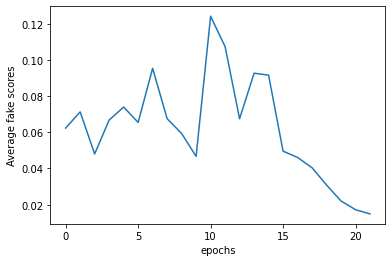

In [ ]:
plt.plot(avgs)
plt.xlabel("epochs")
plt.ylabel("Average fake scores")
plt.show()

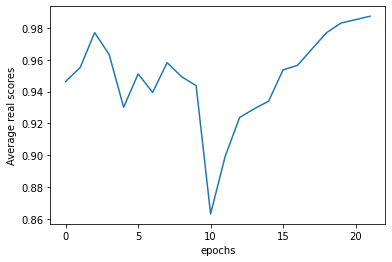

In [ ]:
plt.plot(averages)
plt.xlabel("epochs")
plt.ylabel("Average real scores")
plt.show()

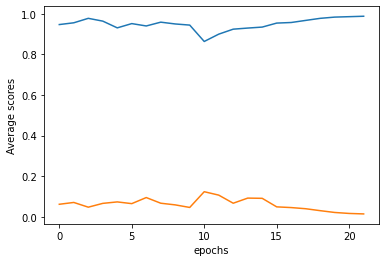

In [ ]:
plt.plot(averages)
plt.plot(avgs)
plt.xlabel("epochs")
plt.ylabel("Average scores")
plt.show()

In [ ]:
i=0
ls_d=[]

In [ ]:
while(i<250): 
  ls=losses_d[i:i+10]
  i+=11
  x=sum(ls) / len(ls)
  ls_d.append(x) 

In [ ]:
i=0
ls_g=[]

In [ ]:
while(i<250): 
  ls=losses_g[i:i+10]
  i+=11
  x=sum(ls) / len(ls)
  ls_g.append(x) 

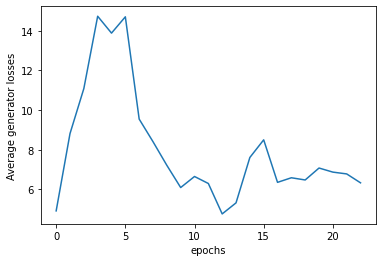

In [ ]:
plt.plot(ls_g)
plt.xlabel("epochs")
plt.ylabel("Average generator losses")
plt.show()

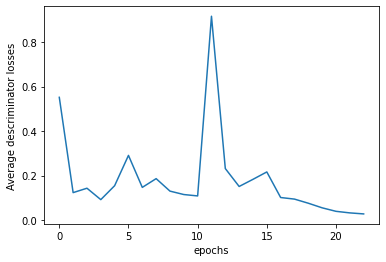

In [ ]:
plt.plot(ls_d)
plt.xlabel("epochs")
plt.ylabel("Average descriminator losses")
plt.show()

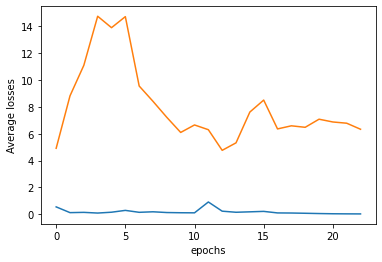

In [ ]:
plt.plot(ls_d)
plt.plot(ls_g)
plt.xlabel("epochs")
plt.ylabel("Average losses")
plt.show()

In [ ]:
# Save the model checkpoints 
torch.save(generator.state_dict(), 'G.ckpt')
torch.save(discriminator.state_dict(), 'D.ckpt')

In [ ]:
from IPython.display import Image

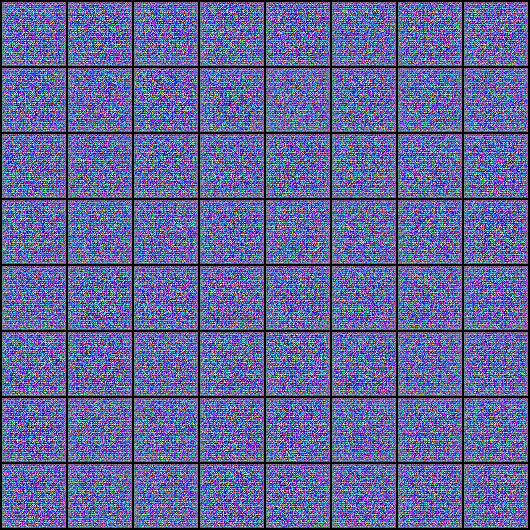

In [ ]:
Image('./generated/generated-images-0001.png')

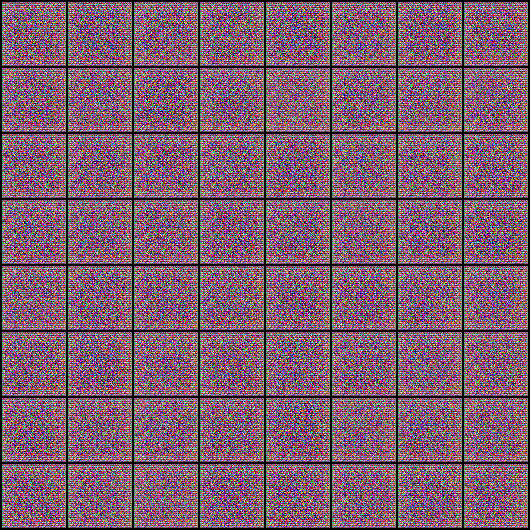

In [ ]:
Image('./generated/generated-images-0005.png')

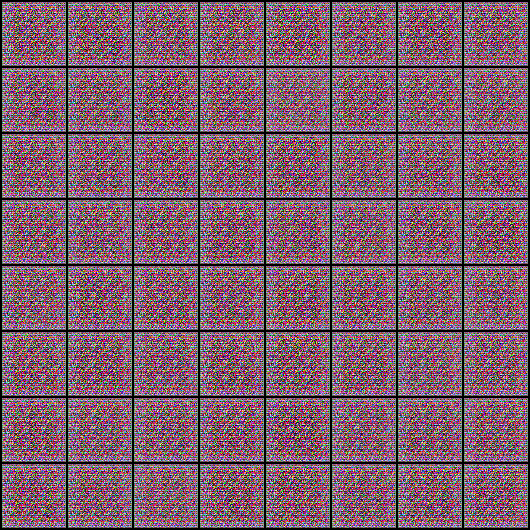

In [ ]:
Image('./generated/generated-images-0010.png')

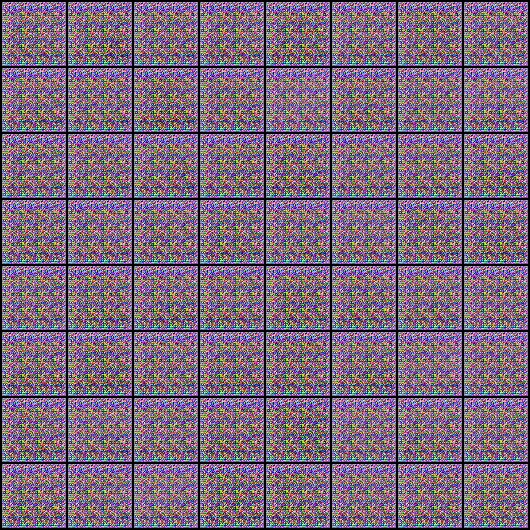

In [ ]:
Image('./generated/generated-images-0030.png')

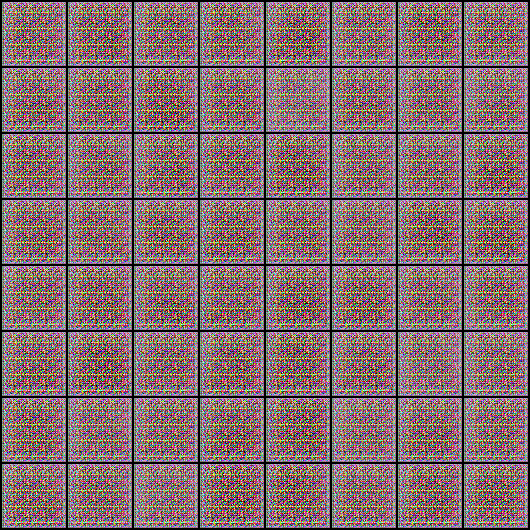

In [ ]:
Image('./generated/generated-images-0050.png')

In [ ]:
import cv2
import os

vid_fname = 'gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

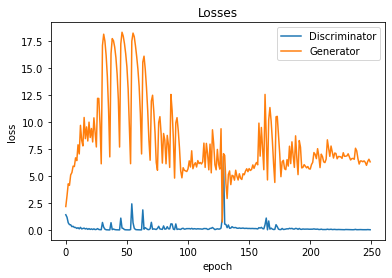

In [ ]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

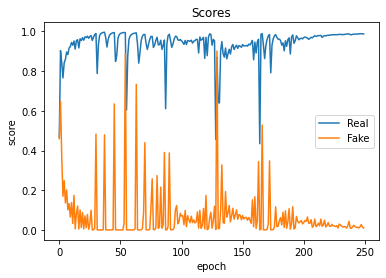

In [ ]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');